# Парсим данные

In [ ]:
import os, time, requests, shutil, torch
import urllib.request
from tqdm import tqdm
from PIL import Image
from io import BytesIO
from torchvision import models
from duckduckgo_search import DDGS
import torchvision.transforms as transforms
from sklearn.model_selection import train_test_split

url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
with urllib.request.urlopen(url) as response:
    imagenet_classes = [line.decode('utf-8').strip() for line in response.readlines()]


ALLOWED_KEYWORDS = ['car', 'automobile', 'cab', 'limousine', 'minivan', 'pickup', 'convertible', 'sports car']

model = models.resnet50(pretrained=True)
model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

def is_car_image(image: Image.Image) -> bool:
    try:
        preprocess = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
        ])
        input_tensor = preprocess(image)
        input_batch = input_tensor.unsqueeze(0).to(device)

        with torch.no_grad():
            output = model(input_batch)
        probabilities = torch.nn.functional.softmax(output[0], dim=0)
        top5_prob, top5_catid = torch.topk(probabilities, 5)
        for i in range(top5_prob.size(0)):
            label = imagenet_classes[top5_catid[i]]
            for keyword in ALLOWED_KEYWORDS:
                if keyword in label.lower():
                    return True
        return False
    except Exception as e:
        return False

def download_images(search_queries, folder, limit=1000):
    """Скачивает изображения автомобилей в указанную папку с дополнительной фильтрацией через классификатор"""
    if not os.path.exists(folder):
        os.makedirs(folder)

    downloaded_count = 0
    with tqdm(total=limit, desc=f"Downloading {os.path.basename(folder)}") as pbar:
        with DDGS() as ddgs:
            for query in search_queries:
                try:
                    results = list(ddgs.images(query, max_results=limit - downloaded_count))
                    for result in results:
                        image_url = result["image"]
                        try:
                            response = requests.get(image_url, timeout=10, stream=True)
                            response.raise_for_status()
                            image = Image.open(BytesIO(response.content))
                            if image.format.lower() not in ["jpeg", "jpg", "png"]:
                                continue
                            if not is_car_image(image):
                                continue

                            image_path = os.path.join(folder, f"{downloaded_count + 1}.jpg")
                            with open(image_path, "wb") as file:
                                file.write(response.content)

                            downloaded_count += 1
                            pbar.update(1)

                            if downloaded_count >= limit:
                                return
                        except Exception as e:
                            continue
                    time.sleep(2)
                except Exception as e:
                    continue

def split_dataset(source_dir, dest_dir, train_ratio=0.7, val_ratio=0.15):
    """
    Разбивает изображения из source_dir (где каждая папка – класс)
    на train, val и test с указанными соотношениями и копирует их в dest_dir.
    """
    categories = [cat for cat in os.listdir(source_dir) if os.path.isdir(os.path.join(source_dir, cat))]
    subsets = ['train', 'val', 'test']

    for subset in subsets:
        for category in categories:
            subset_cat_dir = os.path.join(dest_dir, subset, category)
            os.makedirs(subset_cat_dir, exist_ok=True)

    for category in categories:
        category_path = os.path.join(source_dir, category)
        images = [img for img in os.listdir(category_path) if img.lower().endswith(('.jpg', '.jpeg', '.png'))]

        if not images:
            print(f"В категории {category} не найдено изображений для разделения.")
            continue

        train_imgs, temp_imgs = train_test_split(images, train_size=train_ratio, random_state=42)
        val_ratio_adjusted = val_ratio / (1 - train_ratio)
        val_imgs, test_imgs = train_test_split(temp_imgs, train_size=val_ratio_adjusted, random_state=42)

        for img in train_imgs:
            src = os.path.join(category_path, img)
            dst = os.path.join(dest_dir, 'train', category, img)
            shutil.copy(src, dst)
        for img in val_imgs:
            src = os.path.join(category_path, img)
            dst = os.path.join(dest_dir, 'val', category, img)
            shutil.copy(src, dst)
        for img in test_imgs:
            src = os.path.join(category_path, img)
            dst = os.path.join(dest_dir, 'test', category, img)
            shutil.copy(src, dst)

        print(f"{category}: всего {len(images)} изображений, train={len(train_imgs)}, val={len(val_imgs)}, test={len(test_imgs)}")

base_path = "/content"

dataset_raw = os.path.join(base_path, "dataset_raw")
toyota_folder = os.path.join(dataset_raw, "Toyota")
bmw_folder = os.path.join(dataset_raw, "BMW")
other_folder = os.path.join(dataset_raw, "Other")

toyota_models = [
    "Camry", "Corolla", "RAV4", "Land Cruiser", "Supra", "Hilux", "Yaris", "Avalon",
    "Prius", "Highlander", "4Runner", "Tacoma", "Tundra", "Sequoia", "FJ Cruiser",
    "Sienna", "C-HR", "Venza", "Mirai", "bZ4X", "Crown", "Century", "Fortuner",
    "Innova", "Etios", "Aygo", "Land Cruiser Prado", "Hilux", "ProAce", "RAV4"
]
toyota_queries = [f"Toyota {model} photo" for model in toyota_models]

bmw_models = [
    "3 Series", "5 Series", "X5", "M3", "M5", "X3", "i8", "X6", "Z4", "7 Series",
    "4 Series", "X1", "M2", "X7", "2 Series", "i3", "8 Series", "M4", "X4", "6 Series"
]
bmw_queries = [f"BMW {model} photo" for model in bmw_models]

other_models = [
    "Mercedes-Benz C-Class", "Audi A4", "Lexus RX", "Honda Civic", "Ford Mustang",
    "Chevrolet Camaro", "Nissan Altima", "Hyundai Sonata", "Kia Sorento", "Volkswagen Golf",
    "Subaru Impreza", "Mazda MX-5", "Porsche 911", "Jaguar F-Type", "Volvo XC90",
    "Land Rover Defender", "Mitsubishi Lancer Evolution", "Acura NSX", "Infiniti Q50",
    "Mini Cooper", "Rolls-Royce Phantom", "Bentley Continental GT", "Alfa Romeo Giulia",
    "Fiat 500", "Peugeot 508", "Renault Clio", "Skoda Octavia", "Suzuki Swift", "Citroen C3",
    "Lancia Delta", "Genesis G80", "Ram 1500", "Jeep Wrangler"
]
other_queries = [f"{model} photo" for model in other_models]

download_images(toyota_queries, toyota_folder)
download_images(bmw_queries, bmw_folder)
download_images(other_queries, other_folder)

print("Скачивание изображений завершено!")

dataset_split = os.path.join(base_path, "dataset_split")
split_dataset(dataset_raw, dataset_split, train_ratio=0.7, val_ratio=0.15)

print("Разделение на train/val/test завершено!")

# Загрузка данных

In [ ]:
import os, shutil
from google.colab import drive
drive.mount('/content/drive')
source_folder = '/content/drive/MyDrive/car_images'
destination_folder = '/content/car_images'

if not os.path.exists(destination_folder):
    os.makedirs(destination_folder)
try:
    shutil.copytree(source_folder, destination_folder, dirs_exist_ok=True)
    print(f"Файлы успешно скопированы из '{source_folder}' в '{destination_folder}'")
except FileNotFoundError:
    print(f"Папка '{source_folder}' не найдена на Google Drive. Проверьте правильность пути.")
except Exception as e:
    print(f"Произошла ошибка: {e}")

Mounted at /content/drive
Файлы успешно скопированы из '/content/drive/MyDrive/car_images' в '/content/car_images'


# Pytorch

In [ ]:
!pip install torch torchvision -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 113.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 86.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 68.8 MB/s eta 0:00:00


In [ ]:
import torch
import torch.nn as nn # Импорт модуля для создания нейросетей в PyTorch
import torch.optim as optim # Импорт модуля оптимизаторов в PyTorch
import torchvision.models as models # Импорт предобученных моделей из torchvision
import torchvision.transforms as transforms
import torchvision.transforms.v2 as transforms # Импорт модуля для предобработки изображений в PyTorch

from torchvision.datasets import ImageFolder # Импорт класса для загрузки изображений из папок
from torch.utils.data import Dataset # Импорт базового класса Dataset для создания кастомных датасетов
from torch.utils.data import DataLoader # Импорт DataLoader для загрузки данных батчами
from torchvision.io import read_file, decode_image, ImageReadMode # Импорт функций для чтения и декодирования изображений в PyTorch

import os
import glob
import random
import warnings
import functools
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from PIL import Image
from tqdm.notebook import tqdm
from collections import defaultdict
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

color = '#0072b2'
path = '/content/car_images'
warnings.simplefilter("ignore", FutureWarning)

%matplotlib inline
%config InlineBackend.figure_format = 'retina' # Улучшает качество графиков в Jupyter Notebook (ретина-дисплеи)

#plt.style.use('ggplot')
#plt.style.available # Вывод списка доступных стилей в matplotlib

In [ ]:
seed = 12345
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.benchmark = False
torch.backends.cudnn.deterministic = True

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [ ]:
class DatasetCAR(Dataset):
    @staticmethod
    @functools.lru_cache(maxsize=None)
    def list_data_dir(root_dir):
        """
        Читает данные из папки, возвращает пути к файлам и метки классов.

        :return:
        1. Список кортежей (путь к файлу, индекс класса).
        2. Список классов.
        """
        classes = sorted(os.listdir(root_dir))  # Сортируем, чтобы индексы классов были стабильными
        data = []

        for label_index, label in enumerate(classes):
            label_dir = os.path.join(root_dir, label)
            if not os.path.isdir(label_dir):  # Проверяем, что это папка
                continue
            for filepath in glob.glob(os.path.join(label_dir, "*")):
                data.append((filepath, label_index))

        return data, classes

    @staticmethod
    def data_split(data, valid_ratio=0.2, test_ratio=0.1):
        """
        Разделяет данные на train, valid и test с сохранением пропорций классов.

        :param data: Полный список данных.
        :param valid_ratio: Доля валидационных данных от (train + valid).
        :param test_ratio: Доля тестовых данных от общего набора.
        :return: Три списка: train_data, valid_data, test_data.
        """
        label_dict = defaultdict(list)
        for filepath, label in data:
            label_dict[label].append(filepath)

        train_data, valid_data, test_data = [], [], []

        for label, filepaths in label_dict.items():
            # Разделяем на test (10%) и оставшуюся часть (90%)
            train_valid_files, test_files = train_test_split(filepaths, test_size=test_ratio, stratify=None)

            # Оставшуюся часть (train + valid) делим в заданной пропорции
            train_files, valid_files = train_test_split(train_valid_files, test_size=valid_ratio / (1 - test_ratio), stratify=None)

            # Добавляем файлы в соответствующие списки
            train_data.extend((fp, label) for fp in train_files)
            valid_data.extend((fp, label) for fp in valid_files)
            test_data.extend((fp, label) for fp in test_files)

        return train_data, valid_data, test_data

    def __init__(self, root_dir, split="train", transform=None, valid_ratio=0.2, test_ratio=0.1):
        """
        Инициализация датасета.

        :param root_dir: Директория с изображениями.
        :param split: Какую часть данных использовать ('train', 'valid', 'test').
        :param transform: Преобразования изображений.
        :param valid_ratio: Доля валидационных данных.
        :param test_ratio: Доля тестовых данных.
        """
        self.data, self.classes = self.list_data_dir(root_dir)
        train_data, valid_data, test_data = self.data_split(self.data, valid_ratio, test_ratio)

        if split == "train":
            self.data = train_data
        elif split == "valid":
            self.data = valid_data
        elif split == "test":
            self.data = test_data
        else:
            raise ValueError("split должен быть 'train', 'valid' или 'test'")

        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        """
        Возвращает изображение и метку.
        """
        image_path, label = self.data[index]
        image = read_file(image_path)  # Читаем файл
        image = decode_image(image, mode=ImageReadMode.RGB)  # Декодируем в RGB
        if self.transform:
            image = self.transform(image)
        return image, label

In [ ]:
train_dataset = DatasetCAR(path, split='train')
val_dataset = DatasetCAR(path, split='valid')
test_dataset = DatasetCAR(path, split='test')
len(train_dataset), len(val_dataset), len(test_dataset)

(2100, 600, 300)

# Без аугментаций

In [ ]:
train_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToDtype(torch.float32, scale=True),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToDtype(torch.float32, scale=True),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToDtype(torch.float32, scale=True),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Создадим датасеты
train_dataset = DatasetCAR(path, split='train', transform=train_transforms)
val_dataset = DatasetCAR(path, split='valid', transform=val_transforms)
test_dataset = DatasetCAR(path, split='test', transform=test_transforms)

# Создадим датагенераторы
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
classes_list = train_dataset.classes
classes_list

['BMW', 'Other', 'Toyota']

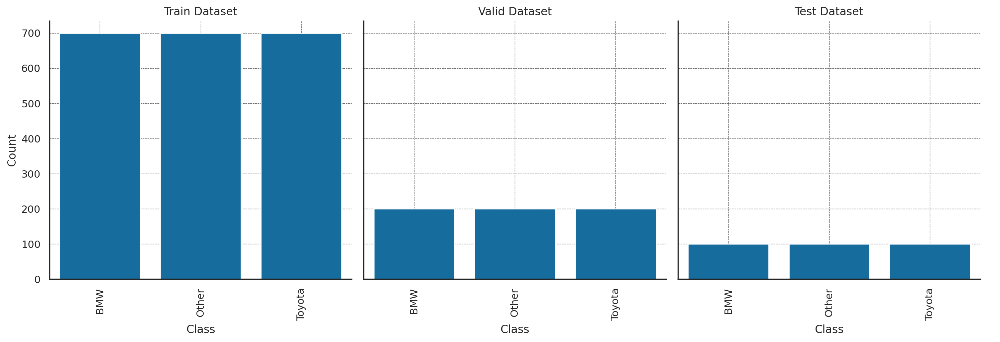

In [ ]:
datasets = {split: DatasetCAR(path, split=split) for split in ['train', 'valid', 'test']}

data = []
for split, ds in datasets.items():
    counts = np.zeros(len(ds.classes))
    for _, label in ds:
        counts[label] += 1
    for class_name, count in zip(ds.classes, counts):
        data.append({'Dataset': split.capitalize(), 'Class': class_name, 'Count': int(count)})

df = pd.DataFrame(data)

sns.set_theme(style="white")
plt.rcParams.update({
    'grid.color': '#555555',
    'grid.linestyle': '--',
    'grid.linewidth': 0.5
})

g = sns.catplot(
    data=df, kind="bar",
    x="Class", y="Count", col="Dataset",
    col_order=["Train", "Valid", "Test"],
    color=color, height=5, aspect=1
)

for ax in g.axes.flat:
    ax.grid(True)
    ax.tick_params(axis='x', rotation=90)

g.set_titles("{col_name} Dataset")
plt.show();

Images with class labels:


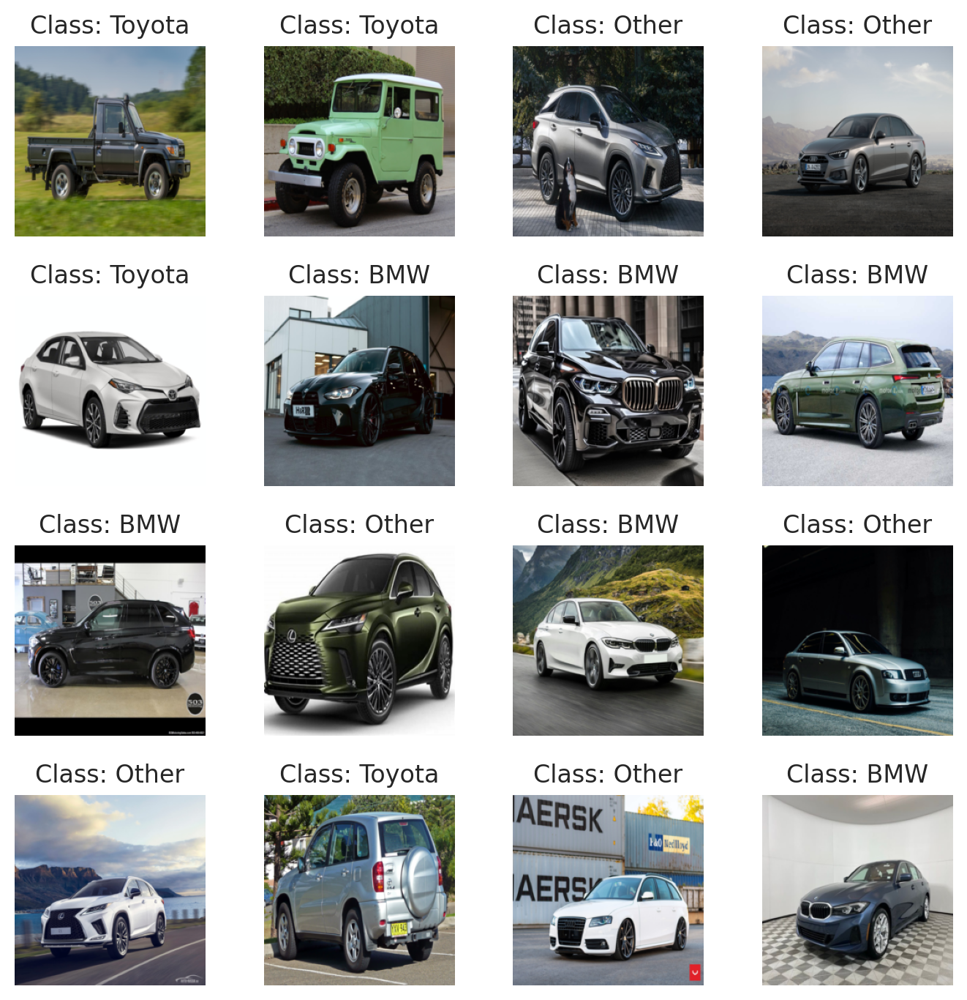

In [ ]:
# Функция для отображения изображений из батча с метками классов
def show_images(images, labels, denormalize=False):
    if denormalize:
        # Обратное преобразование для нормализации
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        images = images.numpy().transpose((0, 2, 3, 1))
        images = std * images + mean
        images = np.clip(images, 0, 1)
    else:
        images = images.numpy().transpose((0, 2, 3, 1))

    fig, axes = plt.subplots(4, 4, figsize=(7, 7))
    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i])
        ax.set_title(f"Class: {classes_list[labels[i]]}")
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Получение первого батча из тренировочного загрузчика данных
images, labels = next(iter(train_loader))

# Отображение изображений с восстановлением цветов и метками классов
print("Images with class labels:")
show_images(images, labels, denormalize=True)

In [ ]:
len(train_loader), len(val_loader), len(test_loader)

(33, 10, 5)

In [ ]:
from torchvision.models import resnet18, ResNet18_Weights
model = resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
# Перевод модели в режим оценки (evaluation mode)
model.eval()

# Перенос модели на выбранное устройство (CPU или GPU)
model.to(device)

# Инициализация переменных для подсчёта правильных предсказаний и общего количества изображений
correct = 0
total = 0

# Отключение вычисления градиентов для ускорения инференса и экономии памяти
with torch.no_grad():
    # Перебор пакетов данных из загрузчика валидационного набора
    for images, labels in tqdm(val_loader):
        # Перенос изображений и меток на выбранное устройство
        images, labels = images.to(device), labels.to(device)

        # Получение предсказаний модели для текущего пакета изображений
        outputs = model(images)

        # Определение индекса класса с максимальной вероятностью для каждого примера
        # outputs.max(1) возвращает кортеж (значения, индексы); нам нужны индексы
        _, predicted = outputs.max(1)

        # Обновление общего количества примеров
        total += labels.size(0)

        # Суммирование количества правильных предсказаний
        correct += predicted.eq(labels).sum().item()

# Вычисление точности валидационного набора
val_accuracy = correct / total
print(f"Accuracy: {val_accuracy}")

  0%|          | 0/10 [00:00<?, ?it/s]

Accuracy: 0.3333333333333333


In [ ]:
num_classes = len(classes_list)
model.fc = nn.Linear(model.fc.in_features, num_classes)
class ResNet18ForFineTune(nn.Module):

    def __init__(self):
        super().__init__()
        self.resnet = resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
        self.resnet.fc = nn.Linear(self.resnet.fc.in_features, num_classes)

    def forward(self, x):
        return self.resnet(x)

model = ResNet18ForFineTune()

In [ ]:
def train(model, loss_fn, optimizer, dataloader):
    model.train()
    train_loss = 0
    train_acc = 0
    it_count = len(dataloader)
    with tqdm(total=it_count) as pbar:
        for batch, (images, labels) in enumerate(dataloader):
            images, labels = images.to(device), labels.to(device)

            # Forward pass
            outputs = model(images)
            loss = loss_fn(outputs, labels)
            train_loss += loss.item()
            train_acc += (outputs.argmax(dim=1) == labels).float().mean().item()

            # Backprpagation and optimization
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            pbar.update(1)

            if batch % (it_count // 3) == 0:
                pbar.set_description(f"Train_loss: {round(train_loss / (batch + 1), 3)}" + f" Train_acc: {round(train_acc / (batch + 1), 3)}")

    return train_loss / it_count, train_acc / it_count


def test(model, loss_fn, dataloader):
    model.eval()
    test_loss = 0
    test_acc = 0
    it_count = len(dataloader)
    with tqdm(total=it_count) as pbar:
        with torch.no_grad():
            for batch, (images, labels) in enumerate(dataloader):
                images, labels = images.to(device), labels.to(device)

                # Forward pass
                outputs = model(images)
                loss = loss_fn(outputs, labels)
                test_loss += loss.item()
                test_acc += (outputs.argmax(dim=1) == labels).float().mean().item()

                pbar.update(1)

                if batch % (it_count // 3) == 0:
                    pbar.set_description(f"Test_loss: {round(test_loss / (batch + 1), 3)}" + f" Test_acc: {round(test_acc / (batch + 1), 3)}")

    return test_loss / it_count, test_acc / it_count


def train_test_loop(model, loss_fn, optimizer, num_epochs):
    train_losses, test_losses = [], []
    train_accs, test_accs = [], []
    best_val_accuracy = 0

    model.to(device)
    for epoch in range(num_epochs):
        print(f"EPOCH {epoch}" + '-' * 100)
        loss, acc = train(model, loss_fn, optimizer, train_loader)
        train_losses.append(loss)
        train_accs.append(acc)

        loss, acc = test(model, loss_fn, val_loader)
        test_losses.append(loss)
        test_accs.append(acc)

        if acc > best_val_accuracy:
            best_val_accuracy = acc
            torch.save(model.state_dict(), 'best_model.pth')
            print('Saved best model!')

    # Сохранение последней актуальной модели
    torch.save(model.state_dict(), 'last_model.pth')
    print()

    return train_losses, test_losses, train_accs, test_accs

In [ ]:
num_epochs = 15
model = ResNet18ForFineTune()
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)
loop_info_finetune = train_test_loop(model, criterion, optimizer, num_epochs)

EPOCH 0----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Saved best model!
EPOCH 1----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Saved best model!
EPOCH 2----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Saved best model!
EPOCH 3----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Saved best model!
EPOCH 4----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Saved best model!
EPOCH 5----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Saved best model!
EPOCH 6----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

EPOCH 7----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

EPOCH 8----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

EPOCH 9----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Saved best model!
EPOCH 10----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

EPOCH 11----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

EPOCH 12----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

EPOCH 13----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

EPOCH 14----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

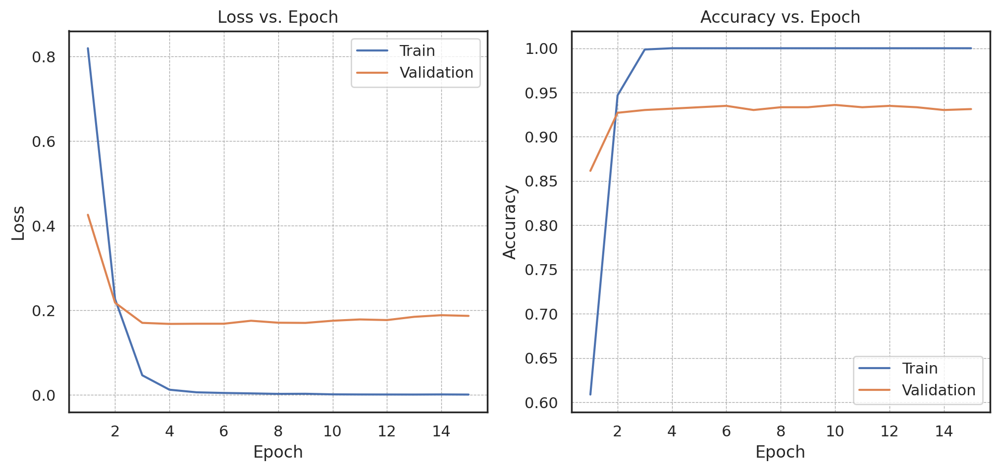

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(range(1, num_epochs+1), loop_info_finetune[0], label='Train')
plt.plot(range(1, num_epochs+1), loop_info_finetune[1], label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epoch')
plt.legend()
plt.grid(color='darkgray')

plt.subplot(1, 2, 2)
plt.plot(range(1, num_epochs+1), loop_info_finetune[2], label='Train')
plt.plot(range(1, num_epochs+1), loop_info_finetune[3], label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epoch')
plt.legend()
plt.grid(color='darkgray')

plt.show()

In [ ]:
# Получение метрик качества для текущих весов модели
def evaluate_model(model, dataloader):
    model.eval()
    y_true = []
    y_pred = []
    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            y_true.extend(labels.cpu().numpy())
            y_pred.extend(predicted.cpu().numpy())
    cm = confusion_matrix(y_true, y_pred)
    report = classification_report(y_true, y_pred)
    accuracy = np.sum(np.diag(cm)) / np.sum(cm)
    # Вычисление взвешенной F1-меры для текущей модели
    weighted_f1 = f1_score(y_true, y_pred, average='weighted')
    return cm, report, accuracy, weighted_f1

# Функция для построения графика матрицы ошибок
def plot_confusion_matrix(cm, classes):
    with plt.style.context('default'):
        plt.figure(figsize=(5, 4))
        sns.set_theme(font_scale=1.0)
        sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False,
                    xticklabels=classes, yticklabels=classes)
        plt.xlabel('Predicted labels')
        plt.ylabel('True labels')
        plt.title('Confusion Matrix')
        plt.show()

<ipython-input-27-813c7ac9fdd6>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


Metrics for current model:
              precision    recall  f1-score   support

           0       0.97      0.92      0.95       200
           1       0.90      0.93      0.91       200
           2       0.93      0.95      0.94       200

    accuracy                           0.93       600
   macro avg       0.93      0.93      0.93       600
weighted avg       0.93      0.93      0.93       600

Test Accuracy: 0.9317


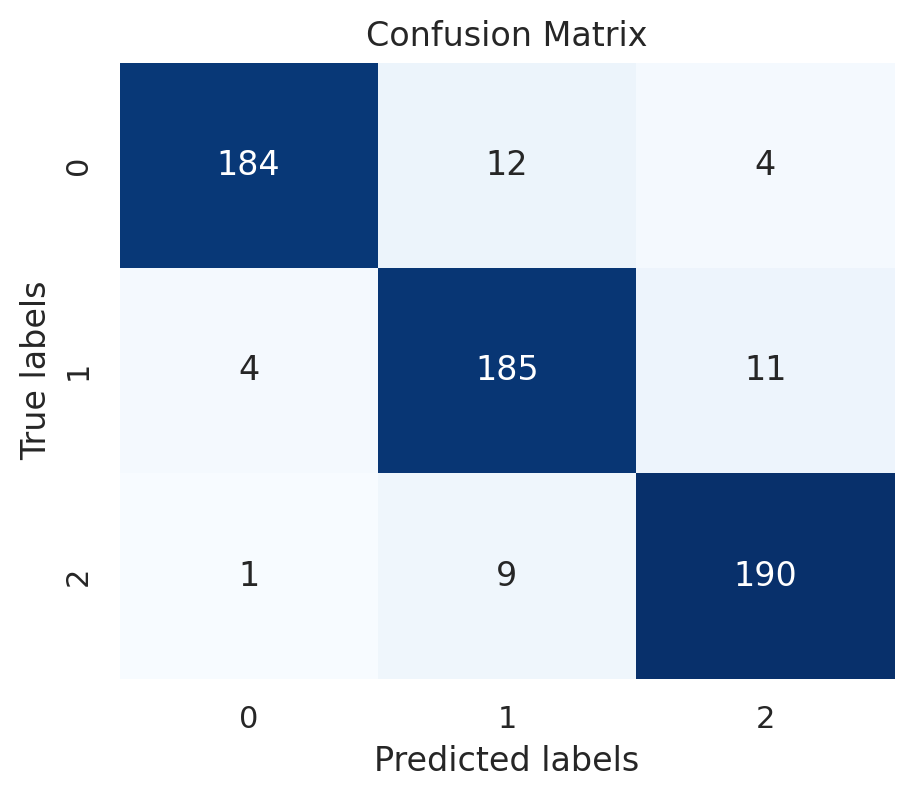

In [ ]:
# Загрузка весов модели
model.load_state_dict(torch.load('best_model.pth'))
model.to(device)

# Оценка модели и построение матрицы ошибок
cm, report, accuracy_1, weighted_f1_1 = evaluate_model(model, val_loader)
print("Metrics for current model:")
print(report)
print(f'Test Accuracy: {accuracy_1:.4f}')
plot_confusion_matrix(cm, classes=list(range(len(classes_list))))

In [ ]:
# Загрузим предварительно обученную модель ResNet18
model = ResNet18ForFineTune()
model.load_state_dict(torch.load('best_model.pth'))
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
model.eval()

# Предобработка изображения
preprocess = transforms.Compose([
    transforms.Resize(235),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

<ipython-input-29-0b1e3933a021>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))
/usr/local/lib/python3.11/dist-packages/

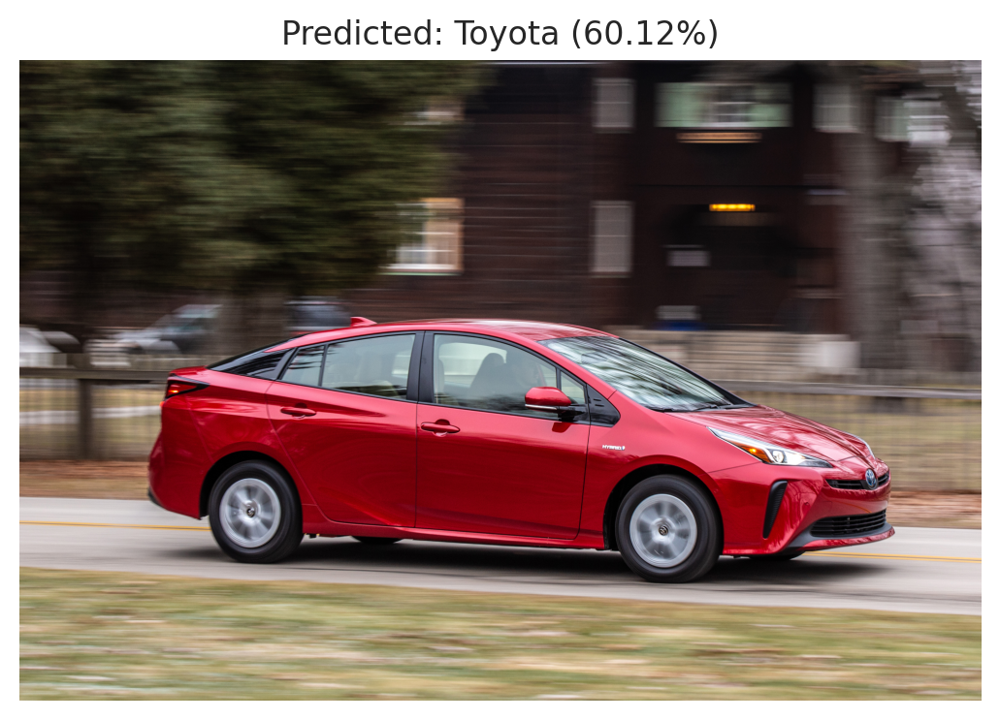

In [ ]:
image_path = '/content/car_images/Toyota/1000.jpg'
image = Image.open(image_path)
image_tensor = preprocess(image)
image_tensor = image_tensor.unsqueeze(0).to(device)

# Прогоните изображение через модель
with torch.no_grad():
    output = model(image_tensor)

# Примените softmax для получения вероятностей классов
probabilities = torch.nn.functional.softmax(output[0], dim=0).cpu()

# Отображение результатов
top_prob, top_class = torch.topk(probabilities, 1)
top_prob = top_prob.item()
top_class = top_class.item()

# Получить имя класса
class_name = train_dataset.classes[top_class]

# Отобразить изображение
plt.imshow(image)
plt.axis('off')
plt.title(f'Predicted: {class_name} ({top_prob*100:.2f}%)')
plt.show()

# C аугментацией

In [ ]:
train_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.RandomRotation(10),
    transforms.CenterCrop(224),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
    transforms.ConvertImageDtype(torch.float32),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


val_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ConvertImageDtype(torch.float32),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ConvertImageDtype(torch.float32),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


# Создадим датасеты
train_dataset = DatasetCAR(path, split='train', transform=train_transforms)
val_dataset = DatasetCAR(path, split='valid', transform=val_transforms)
test_dataset = DatasetCAR(path, split='test', transform=test_transforms)

# Создадим датагенераторы
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

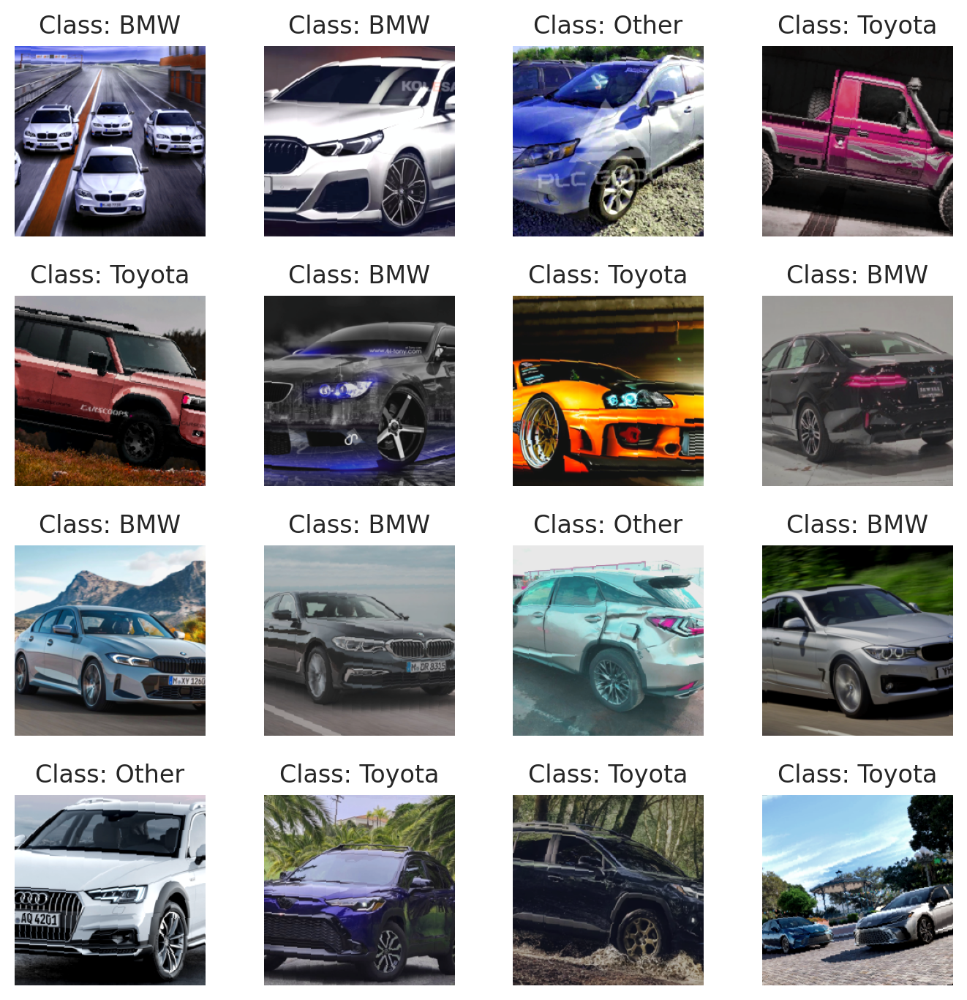

In [ ]:
images, labels = next(iter(train_loader))
show_images(images, labels, denormalize=True)

In [ ]:
num_epochs = 15
model = ResNet18ForFineTune()
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)
loop_info_finetune = train_test_loop(model, criterion, optimizer, num_epochs)

EPOCH 0----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Saved best model!
EPOCH 1----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Saved best model!
EPOCH 2----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Saved best model!
EPOCH 3----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Saved best model!
EPOCH 4----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Saved best model!
EPOCH 5----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Saved best model!
EPOCH 6----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

EPOCH 7----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

EPOCH 8----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Saved best model!
EPOCH 9----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Saved best model!
EPOCH 10----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

EPOCH 11----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

EPOCH 12----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

EPOCH 13----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

EPOCH 14----------------------------------------------------------------------------------------------------


  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Saved best model!



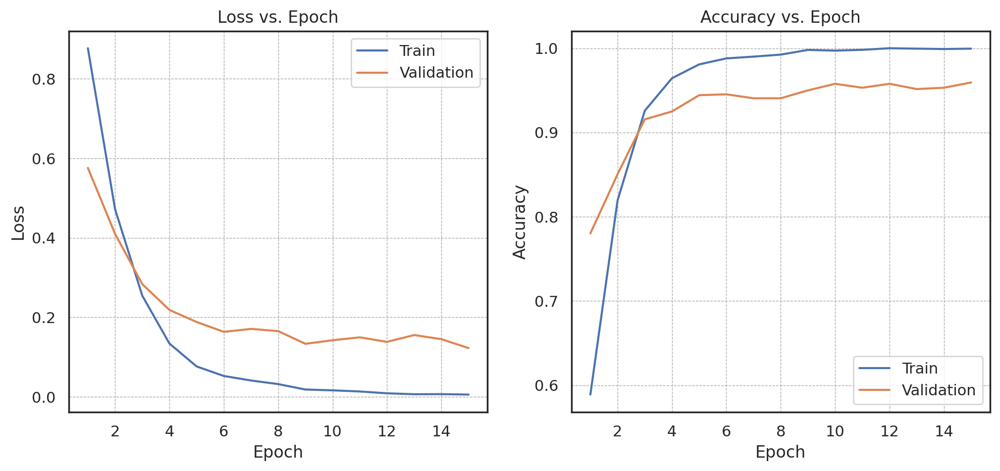

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(range(1, num_epochs+1), loop_info_finetune[0], label='Train')
plt.plot(range(1, num_epochs+1), loop_info_finetune[1], label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epoch')
plt.legend()
plt.grid(color='darkgray')

plt.subplot(1, 2, 2)
plt.plot(range(1, num_epochs+1), loop_info_finetune[2], label='Train')
plt.plot(range(1, num_epochs+1), loop_info_finetune[3], label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epoch')
plt.legend()
plt.grid(color='darkgray')

plt.show()

<ipython-input-41-6aa70db5da27>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


Metrics for current model:
              precision    recall  f1-score   support

           0       0.96      0.95      0.96       200
           1       0.94      0.97      0.96       200
           2       0.96      0.94      0.95       200

    accuracy                           0.96       600
   macro avg       0.96      0.96      0.96       600
weighted avg       0.96      0.96      0.96       600

Test Accuracy: 0.9567


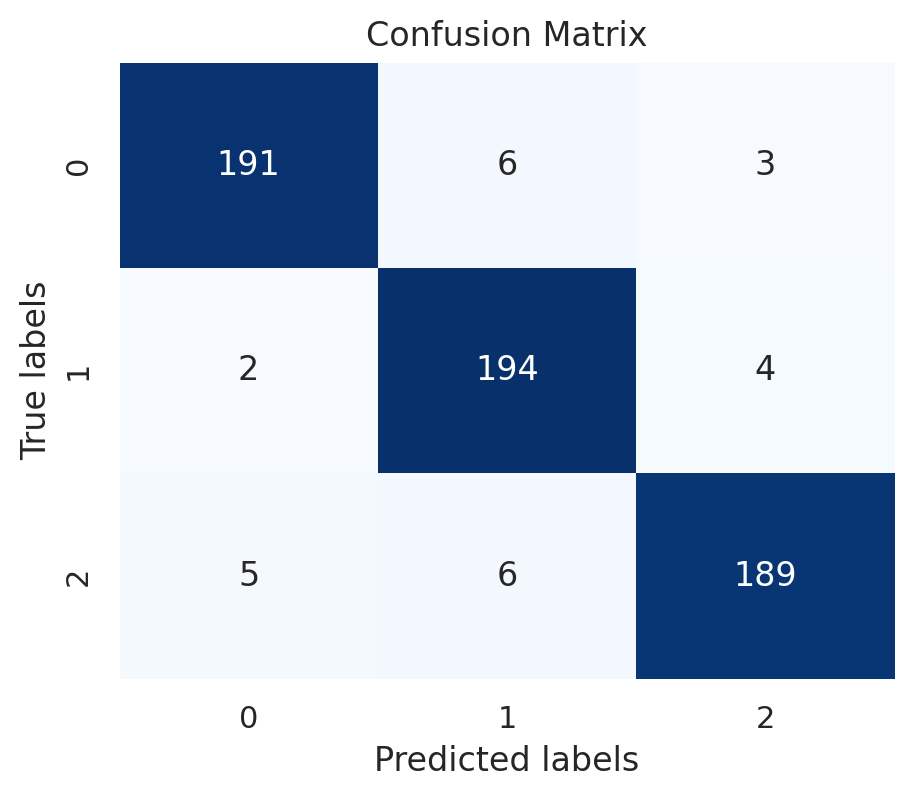

In [ ]:
# Загрузка весов модели
model.load_state_dict(torch.load('best_model.pth'))
model.to(device)

# Оценка модели и построение матрицы ошибок
cm, report, accuracy_2, weighted_f1_2 = evaluate_model(model, val_loader)
print("Metrics for current model:")
print(report)
print(f'Test Accuracy: {accuracy_2:.4f}')
plot_confusion_matrix(cm, classes=list(range(3)))

In [ ]:
model = ResNet18ForFineTune()
model.load_state_dict(torch.load('best_model.pth', map_location=torch.device('cuda')))
model.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu'))
model.eval()  # Перевод в режим оценки

# Функция для вычисления точности
def evaluate_model(model, test_loader, device='cpu'):
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    return accuracy

# Оценка модели
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
accuracy = evaluate_model(model, test_loader, device)

print(f'Точность модели на тестовом наборе: Accuracy = {accuracy:.2f}%')

Точность модели на тестовом наборе: Accuracy = 93.33%


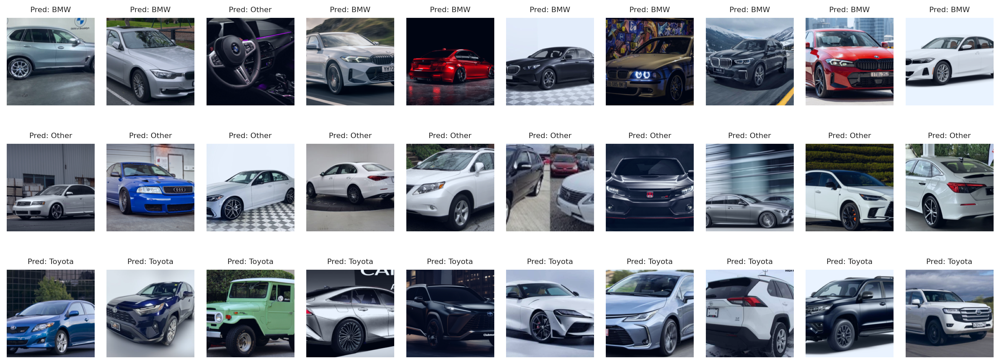

In [ ]:
class_names = test_loader.dataset.classes

def plot_predictions(model, test_loader, device, num_images_per_class=5):
    model.eval()

    images_per_class = {cls: [] for cls in class_names}

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            for img, label, pred in zip(images, labels, preds):
                label_name = class_names[label.item()]
                pred_name = class_names[pred.item()]

                if len(images_per_class[label_name]) < num_images_per_class:
                    images_per_class[label_name].append((img.cpu(), pred_name))

            # Остановимся, если набрали достаточно изображений для всех классов
            if all(len(imgs) >= num_images_per_class for imgs in images_per_class.values()):
                break

    # Визуализация
    fig, axes = plt.subplots(len(class_names), num_images_per_class, figsize=(15, 2 * len(class_names)))

    for row_idx, (class_name, img_list) in enumerate(images_per_class.items()):
        for col_idx, (img, pred_name) in enumerate(img_list):
            img = img.permute(1, 2, 0).numpy()  # Преобразуем тензор в изображение
            img = (img - img.min()) / (img.max() - img.min())  # Нормализация для отображения

            ax = axes[row_idx, col_idx] if len(class_names) > 1 else axes[col_idx]
            ax.imshow(img)
            ax.axis("off")
            ax.set_title(f"Pred: {pred_name}", fontsize=8)

    plt.tight_layout()
    plt.show()

# Вызов функции
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
plot_predictions(model, test_loader, device, num_images_per_class=10)